# Imports

In [1]:
#Prints **all** console output, not just last item in cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
from boilerplate import *
from probdist import *

# Load data

In [3]:
import bokeh.palettes as bp

In [4]:
bp.Colorblind6

['#0072B2', '#E69F00', '#F0E442', '#009E73', '#56B4E9', '#D55E00']

In [5]:
def makeWhich(alignment, stress, pseudocount, color=None, shortID=None):
    assert alignment in {'unaligned', 'Hammond-aligned', 'IPhOD-aligned'}
    assert stress in {'stressed', 'destressed'}
    assert pseudocount in {0, 0.001, 0.0011, 0.005, 0.01, 1}
    
    return {'which_alignment': alignment,
            'which_stress': stress,
            'pseudocount': pseudocount,
            'which_pseudocount': 'pseudocount' + str(pseudocount),
            'whichNoCount': '_'.join([alignment, stress]),
            'which':'_'.join([alignment, stress, 'pseudocount' + str(pseudocount)]),
            'color':color,
            'shortID':shortID}

hd0 = makeWhich('Hammond-aligned', 'destressed', 0, bp.Colorblind6[0], 'hd0')
hd0['which']
hd01 = makeWhich('Hammond-aligned', 'destressed', 0.01, bp.Colorblind6[1], 'hd01')
hd01['which']
hd001 = makeWhich('Hammond-aligned', 'destressed', 0.001, bp.Colorblind6[2], 'hd001')
hd001['which']
hd0011 = makeWhich('Hammond-aligned', 'destressed', 0.0011, bp.Colorblind6[4], 'hd0011')
hd0011['which']
hd005 = makeWhich('Hammond-aligned', 'destressed', 0.005, bp.Colorblind6[5], 'hd005')
hd005['which']

'Hammond-aligned_destressed_pseudocount0'

'Hammond-aligned_destressed_pseudocount0.01'

'Hammond-aligned_destressed_pseudocount0.001'

'Hammond-aligned_destressed_pseudocount0.0011'

'Hammond-aligned_destressed_pseudocount0.005'

In [6]:
hd0

{'which_alignment': 'Hammond-aligned',
 'which_stress': 'destressed',
 'pseudocount': 0,
 'which_pseudocount': 'pseudocount0',
 'whichNoCount': 'Hammond-aligned_destressed',
 'which': 'Hammond-aligned_destressed_pseudocount0',
 'color': '#0072B2',
 'shortID': 'hd0'}

In [7]:
hd01

{'which_alignment': 'Hammond-aligned',
 'which_stress': 'destressed',
 'pseudocount': 0.01,
 'which_pseudocount': 'pseudocount0.01',
 'whichNoCount': 'Hammond-aligned_destressed',
 'which': 'Hammond-aligned_destressed_pseudocount0.01',
 'color': '#E69F00',
 'shortID': 'hd01'}

In [8]:
hd001

{'which_alignment': 'Hammond-aligned',
 'which_stress': 'destressed',
 'pseudocount': 0.001,
 'which_pseudocount': 'pseudocount0.001',
 'whichNoCount': 'Hammond-aligned_destressed',
 'which': 'Hammond-aligned_destressed_pseudocount0.001',
 'color': '#F0E442',
 'shortID': 'hd001'}

In [9]:
hd0011

{'which_alignment': 'Hammond-aligned',
 'which_stress': 'destressed',
 'pseudocount': 0.0011,
 'which_pseudocount': 'pseudocount0.0011',
 'whichNoCount': 'Hammond-aligned_destressed',
 'which': 'Hammond-aligned_destressed_pseudocount0.0011',
 'color': '#56B4E9',
 'shortID': 'hd0011'}

In [10]:
hd005

{'which_alignment': 'Hammond-aligned',
 'which_stress': 'destressed',
 'pseudocount': 0.005,
 'which_pseudocount': 'pseudocount0.005',
 'whichNoCount': 'Hammond-aligned_destressed',
 'which': 'Hammond-aligned_destressed_pseudocount0.005',
 'color': '#D55E00',
 'shortID': 'hd005'}

In [11]:
def loadChannelDists(whichDict, loadTriphChannelDist = False):
    def loadDist(distID, isFreqDist = False):
        dist = importProbDist(whichDict['which'] + ' ' + distID + '.json')
        if not isFreqDist:
            assert areNormalized(dist)
            dist = condDistsAsProbDists(dist)
        whichDict[distID] = dist
    distIDs = {'p3Y01X01','p6Y01X01',
               'p3Y1X01', 'p6Y0X01',
               'p3Y0X01', 'p6Y1X01',
               'pYX', 'p3YX', 'p6YX'}
    for each in distIDs:
        loadDist(each)
    
    if loadTriphChannelDist:
        loadDist('pY1X0X1X2')
    
    loadDist('f3_Y0Y1_X0X1', True)
    loadDist('f6_Y0Y1_X0X1', True)

In [12]:
loadChannelDists(hd0)
hd0.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'])

In [13]:
loadChannelDists(hd01, True)
hd01.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'pY1X0X1X2', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'])

In [14]:
loadChannelDists(hd001, True)
hd001.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'pY1X0X1X2', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'])

In [15]:
loadChannelDists(hd0011, True)
hd0011.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'pY1X0X1X2', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'])

In [16]:
loadChannelDists(hd005, True)
hd005.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'pY1X0X1X2', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'])

In [17]:
def comparableDists(wdA, wdB, compareTriphDist = False, showDiffs = False):
    distIDs = {'p3Y01X01','p6Y01X01',
               'p3Y1X01', 'p6Y0X01',
               'p3Y0X01', 'p6Y1X01',
               'pYX', 'p3YX', 'p6YX'}
    triphDistID = 'pY1X0X1X2'
    freqDistIDs = {'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1'}
    allIDs = union([distIDs, {triphDistID}, freqDistIDs])
    for eachID in allIDs:
        for eachWD in [wdA, wdB]:
            if eachID not in eachWD:
                print('{0} not in {1}'.format(eachID, eachWD))
    for each in distIDs:
        if set(conditions(wdA[each])) != set(conditions(wdB[each])):
            print('{0} and {1} differ on conditions for {2}:'.format(wdA['which'],
                                                                     wdB['which'],
                                                                     each))
            if showDiffs:
                print('\t{0} in '.format(each) + wdA['which'] + ' - ' + '{0} in '.format(each) + wdB['which'])
                print( set(conditions(wdA[each])) - set(conditions(wdB[each])) )
                print('\t{0} in '.format(each) + wdB['which'] + ' - ' + '{0} in '.format(each) + wdA['which'])
                print( set(conditions(wdB[each])) - set(conditions(wdA[each])) )

        if uniformOutcomes(wdA[each]) != True:
            print(wdA['which'] + ' does not have uniform outcomes for {0}'.format(each))
        if uniformOutcomes(wdB[each]) != True:
            print(wdB['which'] + ' does not have uniform outcomes for {0}'.format(each))
            
        if outcomes(wdA[each]) != outcomes(wdB[each]):
            print('{0} and {1} differ on outcomes for {2}:'.format(wdA['which'],
                                                                   wdB['which'],
                                                                   each))
            if showDiffs:
                print('\t{0} in '.format(each) + wdA['which'] + ' - ' + '{0} in '.format(each) + wdB['which'])
                print( outcomes(wdA[each]) - outcomes(wdB[each]) )
                print('\t{0} in '.format(each) + wdB['which'] + ' - ' + '{0} in '.format(each) + wdA['which'])
                print( outcomes(wdB[each]) - outcomes(wdA[each]) )

    if compareTriphDist:
        if set(conditions(wdA[triphDistID])) != set(conditions(wdB[triphDistID])):
            print('{0} and {1} differ on keys for {2}:'.format(wdA['which'],
                                                               wdB['which'],
                                                               triphDistID))
            if showDiffs:
                print('\t{0} in '.format(triphDistID) + wdA['which'] + ' - ' + '{0} in '.format(triphDistID) + wdB['which'])
                print( set(conditions(wdA[triphDistID])) - set(conditions(wdB[triphDistID])) )
                print('\t{0} in '.format(triphDistID) + wdB['which'] + ' - ' + '{0} in '.format(triphDistID) + wdA['which'])
                print( set(conditions(wdB[triphDistID])) - set(conditions(wdA[triphDistID])) )

        if uniformOutcomes(wdA[triphDistID]) is not True:
            print(wdA['which'] + ' does not have uniform outcomes for {0}'.format(triphDistID))
        if uniformOutcomes(wdB[triphDistID]) is not True:
            print(wdB['which'] + ' does not have uniform outcomes for {0}'.format(triphDistID))
        
        if outcomes(wdA[triphDistID]) != outcomes(wdB[triphDistID]):
            print('{0} and {1} differ on outcomes for {2}:'.format(wdA['which'],
                                                                   wdB['which'],
                                                                   triphDistID))
            if showDiffs:
                print('\t{0} in '.format(triphDistID) + wdA['which'] + ' - ' + '{0} in '.format(triphDistID) + wdB['which'])
                print( outcomes(wdA[each]) - outcomes(wdB[triphDistID]) )
                print('\t{0} in '.format(triphDistID) + wdB['which'] + ' - ' + '{0} in '.format(triphDistID) + wdA['which'])
                print( outcomes(wdB[triphDistID]) - outcomes(wdA[triphDistID]) )
    for each in freqDistIDs:
        if set(conditions(wdA[each])) != set(conditions(wdB[each])):
            print('{0} and {1} differ on conditions for {2}:'.format(wdA['which'],
                                                                     wdB['which'],
                                                                     each))
            if showDiffs:
                print('\t{0} in '.format(each) + wdA['which'] + ' - ' + '{0} in '.format(each) + wdB['which'])
                print( set(conditions(wdA[each])) - set(conditions(wdB[each])) )
                print('\t{0} in '.format(each) + wdB['which'] + ' - ' + '{0} in '.format(each) + wdA['which'])
                print( set(conditions(wdB[each])) - set(conditions(wdA[each])) )

In [18]:
comparableDists(hd0, hd01, showDiffs = False)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
comparableDists(hd0, hd001, showDiffs = False)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
comparableDists(hd0, hd0011, showDiffs = False)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
comparableDists(hd001, hd0011, showDiffs = False)

In [22]:
comparableDists(hd0, hd005, showDiffs = False)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Analyze a family of conditional distributions

## Developing calculation and plotting code...

With respect to a family of conditional distributions $p(Y|X)$, let an **error** denote the event where $y \neq x$.

To calculate a non-vacuous **error rate** with respect to a family of conditional distributions $p(Y|X)$, there are two non-trivial requirements: 
 1. we need a prior $p(X)$.
 2. every outcome $x \in X$ needs at least one corresponding outcome in $y \in Y$ that counts as a *non-error*.

In [23]:
def conditionHasMatchingOutcome(dist, conditioning_event):
    return conditioning_event in outcomes(dist)

def conditionsWithMatchingOutcome(dist):
    return {c for c in dist if conditionHasMatchingOutcome(dist, c)}

def conditionsWithNoMatchingOutcome(dist):
    return set(conditions(dist)) - conditionsWithMatchingOutcome(dist)

def everyConditionHasAMatchingOutcome(dist, asBool = False):
    conditionHasMatch = {c:conditionHasMatchingOutcome(dist, c)
                         for c in dist}
    if not asBool:
        return conditionHasMatch
    return all(conditionHasMatch.values())

def canCalculateErrorRate(condDist, prior):
    priorCoversConditions = all({c in prior for c in condDist})
    everyConditionHasOutcomeMatch = everyConditionHasAMatchingOutcome(condDist, True)
    unCoveredConditions = {c for c in condDist if c not in prior}
    unMatchedConditions = conditionsWithNoMatchingOutcome(condDist)
#     assert all({c in prior for c in condDist})
#     assert everyConditionHasAMatchingOutcome(condDist, True)
    if priorCoversConditions and everyConditionHasOutcomeMatch:
        return True
    elif priorCoversConditions and not everyConditionHasOutcomeMatch:
        return False, 'Not every condition has a matching outcome.', unMatchedConditions
    elif everyConditionHasOutcomeMatch and not priorCoversConditions:
        return False, 'Prior does not specify a probability for every condition.', unCoveredConditions

In [24]:
distIDs = ['p3Y01X01','p6Y01X01',
#            'p3Y1X01', 'p6Y0X01',
#            'p3Y0X01', 'p6Y1X01',
           'pYX', 'p3YX', 'p6YX']
allDistIDs = distIDs #+ ['pY1X0X1X2']

for model in [hd0, hd01, hd001, hd0011, hd005]:
    for distID in allDistIDs:
        if distID in model:
            result = canCalculateErrorRate(model[distID], 
                                           Uniform(set(conditions(model[distID]))))
            if result != True:
                print("Can't do a trivial error rate calculation for {0} in {1} because:\n\t{2}".format(distID, 
                                                                                                        model['which'],
                                                                                                        result[1]#, result[2]
                                                                                                        ) )
    print(' ')

Can't do a trivial error rate calculation for p3Y01X01 in Hammond-aligned_destressed_pseudocount0 because:
	Not every condition has a matching outcome.
Can't do a trivial error rate calculation for p6Y01X01 in Hammond-aligned_destressed_pseudocount0 because:
	Not every condition has a matching outcome.
Can't do a trivial error rate calculation for pYX in Hammond-aligned_destressed_pseudocount0 because:
	Not every condition has a matching outcome.
Can't do a trivial error rate calculation for p3YX in Hammond-aligned_destressed_pseudocount0 because:
	Not every condition has a matching outcome.
Can't do a trivial error rate calculation for p6YX in Hammond-aligned_destressed_pseudocount0 because:
	Not every condition has a matching outcome.
 
Can't do a trivial error rate calculation for p3Y01X01 in Hammond-aligned_destressed_pseudocount0.01 because:
	Not every condition has a matching outcome.
Can't do a trivial error rate calculation for p6Y01X01 in Hammond-aligned_destressed_pseudocount

In [25]:
conditionsWithNoMatchingOutcome(hd0['pYX'])
conditionsWithNoMatchingOutcome(hd01['pYX'])
conditionsWithNoMatchingOutcome(hd001['pYX'])
conditionsWithNoMatchingOutcome(hd0011['pYX'])
conditionsWithNoMatchingOutcome(hd005['pYX'])

{'ə'}

{'ə'}

{'ə'}

{'ə'}

{'ə'}

While stimuli diphones in the gating data systematically vary in terms of stress, subject responses do not contain any stress information. Generally speaking, schwa and wedge (`ʌ`) really only differ in terms of stress. (I am told that it is primarily UK phoneticians who maintain there is something more to the difference between schwa and wedge.) Wedge appears in subject responses in the gating data, so that will count as the correct response for schwa.

In [26]:
def matchSymbol(y, x):
    if x == 'ə':
        return y in {'ə', 'ʌ'}
    return x == y

def matchString(v, u):
    u_t = ds2t(u)
    v_t = ds2t(v)
    if len(v_t) != len(u_t):
#         print(u_t)
#         print(v_t)
        return False
#     for y,x in zip(v_t, u_t):
#         print(y)
#         print(x)
#         print(matchSymbol(y,x))
#         print('---')
    return all([matchSymbol(y,x) for y,x in zip(v_t, u_t)])

list(zip('abc', '123'))

matchString('a.b.c', '1.2.3') #should be False
matchString('a.b.c', 'a.b.c') #should be True
matchString('a.ə.c', 'a.ʌ.c') #should be False
matchString('a.ʌ.c', 'a.ə.c') #should be True

schwa = 'ə'
wedge = 'ʌ'

[('a', '1'), ('b', '2'), ('c', '3')]

False

True

False

True

The function below calculates the probability for each condition $c$ that the resulting outcome $o = c$ - the 'probability of correct transmission of $c$'.

In [27]:
def calculateCorrectProbs(condDist, identityRelation = lambda y,x: y == x):
    correctProbs = {c:sum(condDist[c][o] for o in condDist[c] if identityRelation(o, c))
                  for c in condDist}
    return correctProbs

In [28]:
hd0['pYX_correctProbs'] = calculateCorrectProbs(hd0['pYX'], identityRelation = matchSymbol)
hd0['pYX_correctProbs']

{'z': 0.8946400928792573,
 'ʌ': 0.7202399380804955,
 'θ': 0.6907205882352945,
 'k': 0.9122076023391812,
 'n': 0.8828947368421053,
 'w': 0.7558333333333336,
 'ɪ': 0.5547282608695657,
 'ʒ': 0.6997906698564599,
 'i': 0.9635178376906313,
 'ŋ': 0.8663851351351352,
 'ð': 0.24096283783783767,
 'j': 0.722051282051282,
 'ə': 0.3667606516290728,
 'eɪ': 0.9221492921492919,
 'oʊ': 0.852550344462109,
 'd': 0.6806484962406019,
 'ɚ': 0.9470770402755697,
 'aʊ': 0.857164149443561,
 'ɛ': 0.6477976190476192,
 'b': 0.6370300751879702,
 'tʃ': 0.8662538699690404,
 'dʒ': 0.5620162538699691,
 'æ': 0.4675892857142857,
 'p': 0.8784173976608186,
 'm': 0.8477852852852853,
 'r': 0.8372241086587435,
 'f': 0.7521016081871346,
 'h': 0.762945632798574,
 's': 0.891766917293233,
 'ʃ': 0.855764705882353,
 'ɑ': 0.7418123433583957,
 'v': 0.825406346749226,
 'l': 0.867361111111111,
 'ɔɪ': 0.9414014821272885,
 'u': 0.941125408496732,
 't': 0.6543402777777781,
 'aɪ': 0.8234302484302481,
 'g': 0.5911184210526319,
 'ʊ': 0.29634

In [29]:
hd01['pYX_correctProbs'] = calculateCorrectProbs(hd01['pYX'], identityRelation = matchSymbol)
hd01['pYX_correctProbs']

{'p': 0.5714194179905053,
 'v': 0.5412101403546251,
 'tʃ': 0.5692955989944551,
 'ɪ': 0.422861393254932,
 'k': 0.5923071989985029,
 'j': 0.494305453848288,
 's': 0.5795552703604286,
 'aɪ': 0.6440017630761705,
 'θ': 0.45429898414687386,
 'dʒ': 0.36721994429046195,
 'f': 0.4840185151379845,
 'oʊ': 0.6660670816508665,
 'aʊ': 0.6708345293394653,
 'eɪ': 0.7201371034576561,
 'ʌ': 0.4491532128888216,
 'g': 0.3943031777373278,
 'm': 0.5537544617213462,
 'ɔɪ': 0.735689406542347,
 'ð': 0.1630779177882988,
 'b': 0.4250214437905333,
 'ɚ': 0.7303055029970732,
 'ʒ': 0.4652988802255862,
 'r': 0.5402600619174466,
 'ʃ': 0.572638001053443,
 'h': 0.5297296663383715,
 'ʊ': 0.23003455764895112,
 'w': 0.5185276553339735,
 'z': 0.5858481656319712,
 'd': 0.4450623141505694,
 'u': 0.7338367932759177,
 'i': 0.7517003464311117,
 'n': 0.5758356005351615,
 'ə': 0.24736606120705862,
 'ŋ': 0.5806418112509018,
 'l': 0.5640648162048972,
 't': 0.44397208552261835,
 'ɑ': 0.5812164028617166,
 'ɛ': 0.496161359622867,
 'æ':

In [30]:
hd001['pYX_correctProbs'] = calculateCorrectProbs(hd001['pYX'], identityRelation = matchSymbol)
hd001['pYX_correctProbs']

{'f': 0.7109400692173896,
 'ə': 0.34871519863028977,
 't': 0.6222920110043703,
 'ɚ': 0.9193170245254991,
 'v': 0.7823711802636975,
 'n': 0.8362511981832339,
 'ɛ': 0.6281862543353219,
 'θ': 0.6549122876413591,
 'm': 0.8031529246381665,
 'æ': 0.45374734471341205,
 'eɪ': 0.8964069757832079,
 'z': 0.8478893603277655,
 'aɪ': 0.800563138230183,
 'r': 0.7917551479643313,
 'u': 0.914681163820908,
 'd': 0.6448085136172282,
 'tʃ': 0.8213807012911138,
 'k': 0.8634876691528861,
 'p': 0.8317021439284694,
 'w': 0.7211810901967615,
 'h': 0.7292866568777633,
 's': 0.844235365772151,
 'j': 0.6887629007080905,
 'aʊ': 0.8334457722975909,
 'b': 0.6052174990398305,
 'l': 0.8211858949164843,
 'ɑ': 0.7212485370398263,
 'ʒ': 0.6645787039266418,
 'ʃ': 0.8135892892914455,
 'ɔɪ': 0.915204899340184,
 'i': 0.9365024733913924,
 'ʊ': 0.2877608178508867,
 'ɪ': 0.5376077647092142,
 'g': 0.5615410940736135,
 'ŋ': 0.8239307872419183,
 'ð': 0.22909319661955832,
 'oʊ': 0.8287654244382329,
 'ʌ': 0.6777836011689503,
 'dʒ': 

In [31]:
hd0011['pYX_correctProbs'] = calculateCorrectProbs(hd0011['pYX'], identityRelation = matchSymbol)
hd0011['pYX_correctProbs']

{'d': 0.6414560683633347,
 'z': 0.8435125725568315,
 'f': 0.7070961296750623,
 'p': 0.8273326220533068,
 'ð': 0.22798326706897412,
 'θ': 0.6515601663529249,
 'w': 0.7179156510197472,
 'ɚ': 0.9166365764842019,
 'g': 0.5587683951924708,
 'u': 0.9121265092951597,
 'æ': 0.45241268998860434,
 'ʃ': 0.8096293209009754,
 'oʊ': 0.826467630812296,
 'l': 0.8168672718364,
 'dʒ': 0.529507142305718,
 'h': 0.7261079579508857,
 'ʊ': 0.2869330011472479,
 'aʊ': 0.8311536834133608,
 'aɪ': 0.7983537351279648,
 'j': 0.6856265404631671,
 'm': 0.7989764032633441,
 'ɪ': 0.535958156447832,
 'n': 0.831887037593313,
 'i': 0.9338925657670513,
 'ɑ': 0.7192638683325451,
 's': 0.8397898726472292,
 'ɛ': 0.6262955663207229,
 'k': 0.858931326282602,
 'ʌ': 0.6738324759673797,
 'r': 0.787506861232444,
 'eɪ': 0.8939197013952832,
 'ŋ': 0.8199427472328036,
 'b': 0.602234450878612,
 't': 0.6192969644841825,
 'ʒ': 0.6612773303078121,
 'ɔɪ': 0.9126734795353021,
 'v': 0.7783423794601342,
 'tʃ': 0.8171782544326232,
 'ə': 0.34702

In [32]:
hd005['pYX_correctProbs'] = calculateCorrectProbs(hd005['pYX'], identityRelation = matchSymbol)
hd005['pYX_correctProbs']

{'ɪ': 0.4791635414475864,
 'ŋ': 0.6922007987002059,
 'd': 0.5354219646185843,
 'b': 0.5071882512808628,
 'ɔɪ': 0.8246841357606908,
 'ə': 0.2933972187170604,
 'ʃ': 0.6829633974374257,
 'dʒ': 0.44175073591153835,
 'oʊ': 0.7466621655487607,
 'aʊ': 0.7514668378554398,
 'l': 0.6803284002841938,
 'ʒ': 0.556129690667392,
 'm': 0.6667215499905197,
 'ʌ': 0.5507825855882882,
 'tʃ': 0.6837803703788418,
 'r': 0.653598643518523,
 'u': 0.823407965242158,
 'ʊ': 0.2583972804675309,
 'w': 0.6123445678557112,
 'aɪ': 0.7215877357468117,
 'f': 0.5861132051673875,
 'ɛ': 0.5610772469291132,
 'j': 0.5842809860696725,
 'i': 0.8432448741889436,
 'ð': 0.19291047734144198,
 'p': 0.6891473911902772,
 'ɚ': 0.8237157520752385,
 'ɑ': 0.6504911235227839,
 's': 0.6992382953842847,
 'g': 0.4704955505829688,
 'n': 0.6937434272662734,
 't': 0.5247047008193664,
 'z': 0.7047225527214661,
 'v': 0.6506001884118654,
 'θ': 0.5452855591639603,
 'eɪ': 0.8074929605586776,
 'h': 0.6226943120290657,
 'æ': 0.40635359688395306,
 'k':

In [33]:
from bokeh.io import show, output_notebook
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, Legend, HoverTool
from bokeh.plotting import figure
output_notebook()

Loading BokehJS ...

In [34]:
Xs = sorted(list(set(conditions(hd01['pYX_correctProbs']))))
correctProbs0 = [hd0['pYX_correctProbs'][x] for x in Xs]
correctProbs01 = [hd01['pYX_correctProbs'][x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y0=correctProbs0, y1=correctProbs0))

TOOLS = "box_select,lasso_select,help"

# create a new plot and add a renderer
left = figure(x_range=Xs, tools=TOOLS, plot_width=400, plot_height=300, title='hd0 p(Y=x|X=x)')
left.circle('x', 'y0', source=mySource, color='red')

# create another new plot and add a renderer
right = figure(x_range=Xs, tools=TOOLS, plot_width=400, plot_height=300, title='hd01 p(Y=x|X=x)')
right.circle('x', 'y1', source=mySource, color='blue')

p = gridplot([[left, right]])

show(p)

GlyphRenderer(id='1037', ...)

GlyphRenderer(id='1075', ...)

In [35]:
Xs = sorted(list(set(conditions(hd01['pYX_correctProbs']))))
correctProbs0 = [hd0['pYX_correctProbs'][x] for x in Xs]
correctProbs01 = [hd01['pYX_correctProbs'][x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y0=correctProbs0, y1=correctProbs01))

TOOLS = "box_select,lasso_select,help,hover"

# create a new plot and add a renderer
together = figure(x_range=Xs, tools=TOOLS, plot_width=600, plot_height=400, title='p(Y=x|X=x)')
reds = together.circle('x', 'y0', source=mySource, color='red', legend='hd0')
blues = together.circle('x', 'y1', source=mySource, color='blue', legend='hd01')
together.legend.location = 'bottom_left'

legend = Legend(items=[
    ('hd0', [reds]),
    ('hd01', [blues])
], location=(0,-30))
together.add_layout(legend, 'right')

# # create another new plot and add a renderer
# right = figure(x_range=Xs, tools=TOOLS, plot_width=400, plot_height=300, title='hd01 p(Y|X) Error Probability')
# right.circle('x', 'y1', source=mySource)

# p = gridplot([[left, right]])

show(together)

In [36]:
def comparePlotsOfCorrectProbs(wdA, wdB, distID, identityRelation, title = None, wdA_legend_key = None, wdB_legend_key = None, colorA = None, colorB = None, alpha = 1.0):
    wdA_correctProbs = calculateCorrectProbs(wdA[distID], identityRelation = identityRelation)
    wdB_correctProbs = calculateCorrectProbs(wdB[distID], identityRelation = identityRelation)
    
    Xs = sorted(list(set(conditions(wdA_correctProbs))))
    correctProbsA = [wdA_correctProbs[x] for x in Xs]
    correctProbsB = [wdB_correctProbs[x] for x in Xs]

    mySource = ColumnDataSource(data=dict(x=Xs, y0=correctProbsA, y1=correctProbsB))

    TOOLS = "box_select,lasso_select,help"

    # create a new plot and add a renderer
    if title is None:
        title = 'Probability of channel signal matching source signal'
    if wdA_legend_key is None:
        if wdA['shortID'] is None:
            wdA_legend_key = wdA['which']
        else:
            wdA_legend_key = wdA['shortID']
    if wdB_legend_key is None:
        if wdB['shortID'] is None:
            wdB_legend_key = wdB['which']
        else:
            wdB_legend_key = wdB['shortID']
    if colorA is None:
        if wdA['color'] is None:
            colorA = bp.Colorblind3[0]
        else:
            colorA = wdA['color']
    if colorB is None:
        if wdB['color'] is None:
            colorB = bp.Colorblind3[1]
        else:
            colorB = wdB['color']
    together = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title=title)
    A_glyphs = together.circle('x', 'y0', source=mySource, color=colorA, legend=wdA_legend_key, name=wdA_legend_key, alpha=alpha)
    B_glyphs = together.circle('x', 'y1', source=mySource, color=colorB, legend=wdB_legend_key, name=wdB_legend_key, alpha=alpha)
    together.legend.location = 'bottom_left'
    
    hover = HoverTool(
        tooltips=[
            ("{0} p(correct)".format(wdA_legend_key), "@y0"),
            ("{0} p(correct)".format(wdB_legend_key), "@y1"),
            ("x", "@x"),
        ]
    )
    together.add_tools(hover)
    
#     show(together)
    return together

In [37]:
pyx_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'pYX', matchSymbol, 'p(Y=x|X=x)')
show(pyx_plot)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
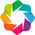

In [38]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [39]:
hd0_pYX_correct = hv.Scatter(hd0['pYX_correctProbs'], 'X', 'p(y = x|X = x)').opts(color='red', tools=['hover'])
# hd0_pYX_correct
hd01_pYX_correct = hv.Scatter(hd01['pYX_correctProbs'], 'X', 'p(y = x|X = x)').opts(color='blue', tools=['hover'])
# hd01_pYX_correct
# pYX_correct_layout = hd0_pYX_correct + hd01_pYX_correct
# pYX_correct_layout
pYX_correct_overlay = hd0_pYX_correct * hd01_pYX_correct
pYX_correct_overlay.opts(width=600, height=400)

:Overlay
   .Scatter.I  :Scatter   [X]   (p(y = x|X = x))
   .Scatter.II :Scatter   [X]   (p(y = x|X = x))

## Channel error probability distribution comparisons

$C(p(Y|X), p(X), \text{id}) = \sum\limits_{x} p(x) \cdot p(y|x) \cdot \text{id}(y,x)$, where
 - $\text{id}(y,x) = 1$ iff $(y,x) \in $ the identity relation $\text{id}$, and $0$ otherwise.
 
$\text{Error}(p(Y|X), p(X), \text{id}) = 1.0 - C(p(Y|X), p(X), \text{id})$

In [40]:
def calculateCorrectRate(condDist, prior = None, identityRelation = lambda y,x: y == x):
    if prior is None:
        prior = Uniform(set(conditions(condDist)))
    
#     unweighted_errorRate = {c:P(lambda o: identityRelation(o, c),
#                                 condDist[c])
#                             for c in condDist}
    correctProbs = {c:sum(condDist[c][o] for o in condDist[c] if identityRelation(o, c))
                  for c in condDist}
    weighted_correctRate = {c:prior[c] * correctProbs[c]
                          for c in condDist}
    return sum(weighted_correctRate.values())

In [41]:
def rateReport(wdA, wdB, distID, prior = None, identityRelation = None):
    if identityRelation is None:
        identityRelation = lambda y,x: y == x
    correctRateA = calculateCorrectRate(wdA[distID], prior, identityRelation)
    if wdB is not None:
        correctRateB = calculateCorrectRate(wdB[distID], prior, identityRelation)

    print('Avg. probability of correct channel tranmsission:')
    print('\t' + wdA['which'] + ':\t' + '{0}'.format(correctRateA))
    if wdB is not None:
        print('\t' + wdB['which'] + ':\t' + '{0}'.format(correctRateB))
    
    print('Avg. probability of channel error:')
    print('\t' + wdA['which'] + ':\t' + '{0}'.format(1.0 - correctRateA))
    if wdB is not None:
        print('\t' + wdB['which'] + ':\t' + '{0}'.format(1.0 - correctRateB))
        
# def avgEntropyReport(wdA, wdB, distID, prior = None):
#     avgEntropyA = sum()

### Uniphone error rate

In [42]:
lowAlpha=0.3
highAlpha=0.6

The plot below combines information about gates 3 and gates 6. (I.e. `pYX` is an aggregate of `p3YX` and `p6YX`.)

In [43]:
pyx_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'pYX', matchSymbol, 'p(Y=x|X=x)')
show(pyx_plot)

rateReport(hd0, hd01, 'pYX', identityRelation = matchSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7492143562656008
	Hammond-aligned_destressed_pseudocount0.01:	0.5243973487738844
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.25078564373439916
	Hammond-aligned_destressed_pseudocount0.01:	0.47560265122611556


In [44]:
pyx_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'pYX', matchSymbol, 'p(Y=x|X=x)')
show(pyx_plot)

rateReport(hd0, hd001, 'pYX', identityRelation = matchSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7492143562656008
	Hammond-aligned_destressed_pseudocount0.001:	0.7165581676441308
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.25078564373439916
	Hammond-aligned_destressed_pseudocount0.001:	0.28344183235586917


In [45]:
pyx_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'pYX', matchSymbol, 'p(Y=x|X=x)')
show(pyx_plot)

rateReport(hd0, hd0011, 'pYX', identityRelation = matchSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7492143562656008
	Hammond-aligned_destressed_pseudocount0.0011:	0.7134787637293369
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.25078564373439916
	Hammond-aligned_destressed_pseudocount0.0011:	0.28652123627066306


In [46]:
pyx_plot = comparePlotsOfCorrectProbs(hd0, hd005, 'pYX', matchSymbol, 'p(Y=x|X=x)')
show(pyx_plot)

rateReport(hd0, hd005, 'pYX', identityRelation = matchSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7492143562656008
	Hammond-aligned_destressed_pseudocount0.005:	0.6136716214806526
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.25078564373439916
	Hammond-aligned_destressed_pseudocount0.005:	0.3863283785193474


## Diphone error rate

$p_3(Y_0, Y_1 | X_0; X_1):$

In [47]:
p3Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p3Y01X01', matchString, 'p3(Y01=x01|X01=x01)', alpha=0.4)
p3Y01X01_plot.xgrid.grid_line_color = None
p3Y01X01_plot.legend.location = 'top_left'

show(p3Y01X01_plot)

rateReport(hd0, hd01, 'p3Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.1376547987616104
	Hammond-aligned_destressed_pseudocount0.01:	0.09485939303299447
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.8623452012383896
	Hammond-aligned_destressed_pseudocount0.01:	0.9051406069670055


In [48]:
p3Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'p3Y01X01', matchString, 'p3(Y01=x01|X01=x01)', alpha=0.4)
p3Y01X01_plot.xgrid.grid_line_color = None
p3Y01X01_plot.legend.location = 'top_left'

show(p3Y01X01_plot)

rateReport(hd0, hd001, 'p3Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.1376547987616104
	Hammond-aligned_destressed_pseudocount0.001:	0.13144205021704275
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.8623452012383896
	Hammond-aligned_destressed_pseudocount0.001:	0.8685579497829572


In [49]:
p3Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'p3Y01X01', matchString, 'p3(Y01=x01|X01=x01)', alpha=0.4)
p3Y01X01_plot.xgrid.grid_line_color = None
p3Y01X01_plot.legend.location = 'top_left'

show(p3Y01X01_plot)

rateReport(hd0, hd0011, 'p3Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.1376547987616104
	Hammond-aligned_destressed_pseudocount0.0011:	0.1308561069023247
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.8623452012383896
	Hammond-aligned_destressed_pseudocount0.0011:	0.8691438930976754


In [50]:
p3Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd005, 'p3Y01X01', matchString, 'p3(Y01=x01|X01=x01)', alpha=0.4)
p3Y01X01_plot.xgrid.grid_line_color = None
p3Y01X01_plot.legend.location = 'top_left'

show(p3Y01X01_plot)

rateReport(hd0, hd005, 'p3Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.1376547987616104
	Hammond-aligned_destressed_pseudocount0.005:	0.11185801632882099
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.8623452012383896
	Hammond-aligned_destressed_pseudocount0.005:	0.888141983671179


$p_6(Y_0, Y_1| X_0, X_1;)$:

In [51]:
p6Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p6Y01X01', matchString, 'p6(Y01=x01|X01=x01)', alpha=0.4)
p6Y01X01_plot.xgrid.grid_line_color = None
# p6Y01X01_plot.legend.location = 'top_left'

show(p6Y01X01_plot)

rateReport(hd0, hd01, 'p6Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.6295439886480895
	Hammond-aligned_destressed_pseudocount0.01:	0.4349640191368021
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.37045601135191053
	Hammond-aligned_destressed_pseudocount0.01:	0.565035980863198


In [52]:
p6Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'p6Y01X01', matchString, 'p6(Y01=x01|X01=x01)', alpha=0.4)
p6Y01X01_plot.xgrid.grid_line_color = None
# p6Y01X01_plot.legend.location = 'top_left'

show(p6Y01X01_plot)

rateReport(hd0, hd001, 'p6Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.6295439886480895
	Hammond-aligned_destressed_pseudocount0.001:	0.6013151954255719
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.37045601135191053
	Hammond-aligned_destressed_pseudocount0.001:	0.3986848045744281


In [53]:
p6Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'p6Y01X01', matchString, 'p6(Y01=x01|X01=x01)', alpha=0.4)
p6Y01X01_plot.xgrid.grid_line_color = None
# p6Y01X01_plot.legend.location = 'top_left'

show(p6Y01X01_plot)

rateReport(hd0, hd0011, 'p6Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.6295439886480895
	Hammond-aligned_destressed_pseudocount0.0011:	0.5986527282007985
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.37045601135191053
	Hammond-aligned_destressed_pseudocount0.0011:	0.4013472717992015


In [54]:
p6Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd005, 'p6Y01X01', matchString, 'p6(Y01=x01|X01=x01)', alpha=0.4)
p6Y01X01_plot.xgrid.grid_line_color = None
# p6Y01X01_plot.legend.location = 'top_left'

show(p6Y01X01_plot)

rateReport(hd0, hd005, 'p6Y01X01', identityRelation = matchString)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.6295439886480895
	Hammond-aligned_destressed_pseudocount0.005:	0.5123030897538445
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.37045601135191053
	Hammond-aligned_destressed_pseudocount0.005:	0.48769691024615547


In [55]:
p3Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p3Y01X01', matchString, 'p3(Y01=x01|X01=x01)')
p3Y01X01_plot.width=6000
p3Y01X01_plot.xgrid.grid_line_color = None
p3Y01X01_plot.legend.location = 'top_left'
show(p3Y01X01_plot)

p6Y01X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p6Y01X01', matchString, 'p6(Y01=x01|X01=x01)')
p6Y01X01_plot.width=6000
p6Y01X01_plot.xgrid.grid_line_color = None
# p6Y01X01_plot.legend.location = 'top_left'
show(p6Y01X01_plot)

In [56]:
schwa
wedge

def matchSymbolToFirstSymbol(y, v):
    v_t = ds2t(v)
    x = v_t[0]
    return matchSymbol(y, x)

def matchSymbolToSecondSymbol(y, v):
    v_t = ds2t(v)
    x = v_t[1]
    return matchSymbol(y, x)

matchSymbolToFirstSymbol('ʌ', 'ə' + '.' +  'i')
matchSymbolToFirstSymbol('ʌ', 'i' + '.' +  'ə')
matchSymbolToSecondSymbol('ʌ', 'ə' + '.' +  'i')
matchSymbolToSecondSymbol('ʌ', 'i' + '.' +  'ə')

'ə'

'ʌ'

True

False

False

True

$p_3(Y_0 | X_0; X_1)$:

In [57]:
p3Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p3Y0X01', matchSymbolToFirstSymbol, 'p3(Y0=x0|X01=x01)', alpha=0.4)
p3Y0X01_plot.xgrid.grid_line_color = None
p3Y0X01_plot.legend.location = 'top_left'

show(p3Y0X01_plot)

rateReport(hd0, hd01, 'p3Y0X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7890350877192942
	Hammond-aligned_destressed_pseudocount0.01:	0.5496868446539309
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.2109649122807058
	Hammond-aligned_destressed_pseudocount0.01:	0.4503131553460691


In [58]:
p3Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'p3Y0X01', matchSymbolToFirstSymbol, 'p3(Y0=x0|X01=x01)', alpha=0.4)
p3Y0X01_plot.xgrid.grid_line_color = None
p3Y0X01_plot.legend.location = 'top_left'

show(p3Y0X01_plot)

rateReport(hd0, hd001, 'p3Y0X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7890350877192942
	Hammond-aligned_destressed_pseudocount0.001:	0.7540875127880379
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.2109649122807058
	Hammond-aligned_destressed_pseudocount0.001:	0.24591248721196213


In [59]:
p3Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'p3Y0X01', matchSymbolToFirstSymbol, 'p3(Y0=x0|X01=x01)', alpha=0.4)
p3Y0X01_plot.xgrid.grid_line_color = None
p3Y0X01_plot.legend.location = 'top_left'

show(p3Y0X01_plot)

rateReport(hd0, hd0011, 'p3Y0X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7890350877192942
	Hammond-aligned_destressed_pseudocount0.0011:	0.750795249073256
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.2109649122807058
	Hammond-aligned_destressed_pseudocount0.0011:	0.249204750926744


$p_6(Y_1| X_0, X_1;)$:

In [60]:
p6Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p6Y1X01', matchSymbolToSecondSymbol, 'p6(Y1=x1|X01=x01)', alpha=0.4)
p6Y0X01_plot.xgrid.grid_line_color = None
p6Y0X01_plot.legend.location = 'top_left'

show(p6Y0X01_plot)

rateReport(hd0, hd01, 'p6Y1X01', identityRelation = matchSymbolToSecondSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7141157120743025
	Hammond-aligned_destressed_pseudocount0.01:	0.5006704016585746
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.28588428792569753
	Hammond-aligned_destressed_pseudocount0.01:	0.49932959834142543


In [61]:
p6Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'p6Y1X01', matchSymbolToSecondSymbol, 'p6(Y1=x1|X01=x01)', alpha=0.4)
p6Y0X01_plot.xgrid.grid_line_color = None
p6Y0X01_plot.legend.location = 'top_left'

show(p6Y0X01_plot)

rateReport(hd0, hd001, 'p6Y1X01', identityRelation = matchSymbolToSecondSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7141157120743025
	Hammond-aligned_destressed_pseudocount0.001:	0.6831245703700026
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.28588428792569753
	Hammond-aligned_destressed_pseudocount0.001:	0.3168754296299974


In [62]:
p6Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'p6Y1X01', matchSymbolToSecondSymbol, 'p6(Y1=x1|X01=x01)', alpha=0.4)
p6Y0X01_plot.xgrid.grid_line_color = None
p6Y0X01_plot.legend.location = 'top_left'

show(p6Y0X01_plot)

rateReport(hd0, hd0011, 'p6Y1X01', identityRelation = matchSymbolToSecondSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.7141157120743025
	Hammond-aligned_destressed_pseudocount0.0011:	0.6802019738619718
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.28588428792569753
	Hammond-aligned_destressed_pseudocount0.0011:	0.3197980261380282


In [63]:
p3Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p3Y0X01', matchSymbolToFirstSymbol, 'p3(Y0=x0|X01=x01)', alpha=0.4)
p3Y0X01_plot.xgrid.grid_line_color = None
p3Y0X01_plot.legend.location = 'top_left'
p3Y0X01_plot.width = 6000

show(p3Y0X01_plot)


p6Y0X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p6Y1X01', matchSymbolToFirstSymbol, 'p6(Y1=x1|X01=x01)', alpha=0.4)
p6Y0X01_plot.xgrid.grid_line_color = None
p6Y0X01_plot.legend.location = 'top_left'
p6Y0X01_plot.width = 6000

show(p6Y0X01_plot)


### Triphone error rate

$p_3(Y_1| X_0, X_1; X_2)$:

In [64]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd01['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title='p3(Y1=x1|X012=x012)')
triphDist_fig.circle('x', 'y', source=mySource, color=hd01['color'], name=hd01['shortID'], alpha = 0.1)
# triphDist_fig.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format('hd01'), "@y"),
        ("x", "@x"),
    ]
)
triphDist_fig.add_tools(hover)

triphDist_fig.xgrid.grid_line_color = None

show(triphDist_fig)

rateReport(hd01, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

GlyphRenderer(id='7346', ...)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.01:	0.8642683488807346
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.01:	0.13573165111926544


In [65]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd001['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title='p3(Y1=x1|X012=x012)')
triphDist_fig.circle('x', 'y', source=mySource, color=hd001['color'], name=hd001['shortID'], alpha = 0.1)
# triphDist_fig.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format('hd001'), "@y"),
        ("x", "@x"),
    ]
)
triphDist_fig.add_tools(hover)

triphDist_fig.xgrid.grid_line_color = None

show(triphDist_fig)

rateReport(hd001, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

GlyphRenderer(id='7660', ...)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.001:	0.7913044063981532
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.001:	0.20869559360184675


In [66]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd0011['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title='p3(Y1=x1|X012=x012)')
triphDist_fig.circle('x', 'y', source=mySource, color=hd0011['color'], name=hd0011['shortID'], alpha = 0.1)
# triphDist_fig.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format('hd0011'), "@y"),
        ("x", "@x"),
    ]
)
triphDist_fig.add_tools(hover)

triphDist_fig.xgrid.grid_line_color = None

show(triphDist_fig)

rateReport(hd0011, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

GlyphRenderer(id='7981', ...)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.0011:	0.7863633006748446
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.0011:	0.2136366993251554


In [67]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd005['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title='p3(Y1=x1|X012=x012)')
triphDist_fig.circle('x', 'y', source=mySource, color=hd005['color'], name=hd005['shortID'], alpha = 0.1)
# triphDist_fig.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format('hd005'), "@y"),
        ("x", "@x"),
    ]
)
triphDist_fig.add_tools(hover)

triphDist_fig.xgrid.grid_line_color = None

show(triphDist_fig)

rateReport(hd005, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

GlyphRenderer(id='8309', ...)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.005:	0.8826994582136877
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.005:	0.11730054178631233


In [68]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd01['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig_WIDE = figure(x_range=Xs, tools=TOOLS, plot_width=12000, plot_height=500, title='p3(Y1=x1|X012=x012)')
triphDist_fig_WIDE.circle('x', 'y', source=mySource, color='blue', name=hd01['shortID'], alpha = 0.1)
# triphDist_fig_WIDE.legend.location = 'bottom_left'

# hover = HoverTool(
#     tooltips=[
#         ("{0} p(correct)".format('hd01'), "@y"),
#         ("x", "@x"),
#     ]
# )
triphDist_fig_WIDE.add_tools(hover)

triphDist_fig_WIDE.xgrid.grid_line_color = None

show(triphDist_fig_WIDE)

rateReport(hd01, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

GlyphRenderer(id='8644', ...)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.01:	0.8642683488807346
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.01:	0.13573165111926544


In [69]:
pY1X0X1X2_correctProbs = calculateCorrectProbs(hd001['pY1X0X1X2'], identityRelation = matchSymbolToSecondSymbol)
    
Xs = sorted(list(set(conditions(pY1X0X1X2_correctProbs))))
correctProbs = [pY1X0X1X2_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=correctProbs))

# TOOLS = "box_select,lasso_select,help"
TOOLS = "help"

triphDist_fig_WIDE = figure(x_range=Xs, tools=TOOLS, plot_width=12000, plot_height=500, title='p3(Y1=x1|X012=x012)')
goldenrods = triphDist_fig_WIDE.circle('x', 'y', source=mySource, color=hd001['color'], name=hd001['shortID'], alpha = 0.4)
# triphDist_fig.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format('hd001'), "@y"),
        ("x", "@x"),
    ]
)
triphDist_fig_WIDE.add_tools(hover)

triphDist_fig_WIDE.xgrid.grid_line_color = None

show(triphDist_fig_WIDE)

rateReport(hd001, None, 'pY1X0X1X2', identityRelation = matchSymbolToSecondSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0.001:	0.7913044063981532
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0.001:	0.20869559360184675


The 'preview distribution' $p_3(X_1|X_0; X_1)$ below represents coarticulatory information about $X_1$ available to the listener even though only $X_0$ has finished; it is combined with the distribution above in calculating the posterior $p(\widehat{X_1}|X_0^1;X_2)$.

$p_3(Y_1|X_0; X_1)$:

In [70]:
p3Y1X01_plot = comparePlotsOfCorrectProbs(hd0, hd01, 'p3Y1X01', matchSymbolToFirstSymbol, 'p3(Y1=x1|X01=x01)', alpha=0.4)
p3Y1X01_plot.xgrid.grid_line_color = None
p3Y1X01_plot.legend.location = 'top_left'

show(p3Y1X01_plot)

rateReport(hd0, hd01, 'p3Y1X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.07216524767801857
	Hammond-aligned_destressed_pseudocount0.01:	0.05454264974245904
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.9278347523219814
	Hammond-aligned_destressed_pseudocount0.01:	0.945457350257541


In [71]:
p3Y1X01_plot = comparePlotsOfCorrectProbs(hd0, hd001, 'p3Y1X01', matchSymbolToFirstSymbol, 'p3(Y1=x1|X01=x01)', alpha=0.4)
p3Y1X01_plot.xgrid.grid_line_color = None
p3Y1X01_plot.legend.location = 'top_left'

show(p3Y1X01_plot)

rateReport(hd0, hd001, 'p3Y1X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.07216524767801857
	Hammond-aligned_destressed_pseudocount0.001:	0.06941528363689868
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.9278347523219814
	Hammond-aligned_destressed_pseudocount0.001:	0.9305847163631014


In [72]:
p3Y1X01_plot = comparePlotsOfCorrectProbs(hd0, hd0011, 'p3Y1X01', matchSymbolToFirstSymbol, 'p3(Y1=x1|X01=x01)', alpha=0.4)
p3Y1X01_plot.xgrid.grid_line_color = None
p3Y1X01_plot.legend.location = 'top_left'

show(p3Y1X01_plot)

rateReport(hd0, hd0011, 'p3Y1X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.07216524767801857
	Hammond-aligned_destressed_pseudocount0.0011:	0.06915921366059612
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.9278347523219814
	Hammond-aligned_destressed_pseudocount0.0011:	0.9308407863394039


In [73]:
p3Y1X01_plot = comparePlotsOfCorrectProbs(hd0, hd005, 'p3Y1X01', matchSymbolToFirstSymbol, 'p3(Y1=x1|X01=x01)', alpha=0.4)
p3Y1X01_plot.xgrid.grid_line_color = None
p3Y1X01_plot.legend.location = 'top_left'

show(p3Y1X01_plot)

rateReport(hd0, hd005, 'p3Y1X01', identityRelation = matchSymbolToFirstSymbol)

Avg. probability of correct channel tranmsission:
	Hammond-aligned_destressed_pseudocount0:	0.07216524767801857
	Hammond-aligned_destressed_pseudocount0.005:	0.06116942349518471
Avg. probability of channel error:
	Hammond-aligned_destressed_pseudocount0:	0.9278347523219814
	Hammond-aligned_destressed_pseudocount0.005:	0.9388305765048153


In [74]:
wdA_correctProbs = calculateCorrectProbs(hd001['p3Y0X01'], identityRelation = matchSymbolToFirstSymbol)
wdB_correctProbs = calculateCorrectProbs(hd001['p6Y1X01'], identityRelation = matchSymbolToSecondSymbol)

Xs = sorted(list(set(conditions(wdA_correctProbs))))
correctProbsA = [wdA_correctProbs[x] for x in Xs]
correctProbsB = [wdB_correctProbs[x] for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y0=correctProbsA, y1=correctProbsB))

TOOLS = "box_select,lasso_select,help"

# create a new plot and add a renderer
title = 'Probability of channel signal matching source signal'
wdA_legend_key = 'p3Y0X01'
wdB_legend_key = 'p6Y1X01'
colorA = 'blue'
colorB = 'red'
together = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title=title)
A_glyphs = together.circle('x', 'y0', source=mySource, color=colorA, legend=wdA_legend_key, name=wdA_legend_key, alpha=0.3)
B_glyphs = together.circle('x', 'y1', source=mySource, color=colorB, legend=wdB_legend_key, name=wdB_legend_key, alpha=0.3)
together.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("{0} p(correct)".format(wdA_legend_key), "@y0"),
        ("{0} p(correct)".format(wdB_legend_key), "@y1"),
        ("x", "@x"),
    ]
)
together.add_tools(hover)
together.xgrid.grid_line_color = None
# together.legend.location = 'top_left'

show(together)

In [75]:
wdA_correctProbs = calculateCorrectProbs(hd001['p3Y0X01'], identityRelation = matchSymbolToFirstSymbol)
wdB_correctProbs = calculateCorrectProbs(hd001['p6Y1X01'], identityRelation = matchSymbolToSecondSymbol)

Xs = sorted(list(set(conditions(wdA_correctProbs))))
correctProbsA = [wdA_correctProbs[x] for x in Xs]
correctProbsB = [wdB_correctProbs[x] for x in Xs]
diffs = [abs(wdA_correctProbs[x] - wdB_correctProbs[x]) for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=diffs))

TOOLS = "box_select,lasso_select,help"

# create a new plot and add a renderer
title = 'Difference in probability of channel signal matching source signal: |p3Y0X01 - p6Y1X01|'
# wdA_legend_key = 'p3Y0X01'
# wdB_legend_key = 'p6Y1X01'
colorA = 'lime'
# colorB = 'red'
myPlot = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title=title)
A_glyphs = myPlot.circle('x', 'y', source=mySource, color=colorA, alpha=1.0)
# B_glyphs = myPlot.circle('x', 'y1', source=mySource, color=colorB, legend=wdB_legend_key, name=wdB_legend_key, alpha=0.3)
# myPlot.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("|p3(correct) - p6(correct)|", "@y"),
#         ("{0} p(correct)".format(wdA_legend_key), "@y0"),
#         ("{0} p(correct)".format(wdB_legend_key), "@y1"),
        ("x", "@x"),
    ]
)
myPlot.add_tools(hover)
myPlot.xgrid.grid_line_color = None
# myPlot.legend.location = 'top_left'

show(myPlot)

diphoneDist = Uniform(Xs)
print('Avg. magnitude of discrepancy:')
print(sum([diphoneDist[x] * abs(wdA_correctProbs[x] - wdB_correctProbs[x])
           for x in diphoneDist]))

Avg. magnitude of discrepancy:
0.25445995266426646


In [76]:
wdA_correctProbs = calculateCorrectProbs(hd001['p3Y0X01'], identityRelation = matchSymbolToFirstSymbol)
wdB_correctProbs = calculateCorrectProbs(hd001['p6Y1X01'], identityRelation = matchSymbolToSecondSymbol)

Xs = sorted(list(set(conditions(wdA_correctProbs))), key = lambda diph: ds2t(diph)[1])
correctProbsA = [wdA_correctProbs[x] for x in Xs]
correctProbsB = [wdB_correctProbs[x] for x in Xs]
diffs = [abs(wdA_correctProbs[x] - wdB_correctProbs[x]) for x in Xs]

mySource = ColumnDataSource(data=dict(x=Xs, y=diffs))

TOOLS = "box_select,lasso_select,help"

# create a new plot and add a renderer
title = 'Difference in probability of channel signal matching source signal: |p3Y0X01 - p6Y1X01|'
# wdA_legend_key = 'p3Y0X01'
# wdB_legend_key = 'p6Y1X01'
colorA = 'green'
# colorB = 'red'
myPlot = figure(x_range=Xs, tools=TOOLS, plot_width=800, plot_height=500, title=title)
A_glyphs = myPlot.circle('x', 'y', source=mySource, color=colorA, alpha=1.0)
# B_glyphs = myPlot.circle('x', 'y1', source=mySource, color=colorB, legend=wdB_legend_key, name=wdB_legend_key, alpha=0.3)
# myPlot.legend.location = 'bottom_left'

hover = HoverTool(
    tooltips=[
        ("|p3(correct) - p6(correct)|", "@y"),
#         ("{0} p(correct)".format(wdA_legend_key), "@y0"),
#         ("{0} p(correct)".format(wdB_legend_key), "@y1"),
        ("x", "@x"),
    ]
)
myPlot.add_tools(hover)
myPlot.xgrid.grid_line_color = None
# myPlot.legend.location = 'top_left'

show(myPlot)

diphoneDist = Uniform(Xs)
print('Avg. magnitude of discrepancy:')
print(sum([diphoneDist[x] * abs(wdA_correctProbs[x] - wdB_correctProbs[x])
           for x in diphoneDist]))

Avg. magnitude of discrepancy:
0.2544599526642662


# Similarity measures

Which channel distributions are most similar to a given reference distribution $h^*$?

In [77]:
hd001.keys()

dict_keys(['which_alignment', 'which_stress', 'pseudocount', 'which_pseudocount', 'whichNoCount', 'which', 'color', 'shortID', 'p3Y01X01', 'p3Y0X01', 'p3YX', 'pYX', 'p6Y1X01', 'p6YX', 'p6Y0X01', 'p3Y1X01', 'p6Y01X01', 'pY1X0X1X2', 'f3_Y0Y1_X0X1', 'f6_Y0Y1_X0X1', 'pYX_correctProbs'])

In [78]:
Ps = hd001['pYX']
h_star = getRandomKey(Ps)
h_star

h_alt = getRandomKey(Ps)
h_alt

P_star = Ps[h_star]
P_alt = Ps[h_alt]

'aɪ'

'i'

In [79]:
def divergences(c, condDists):
    return {c_prime:DKL(condDists[c], condDists[c_prime])
            for c_prime in condDists}

def avgDivergence(c, condDists, prior = None):
    if prior is None:
        prior = Uniform(conditions(condDists))
    
    divs = divergences(c, condDists)
    return sum(prior[c_prime]*divs[c_prime] for c_prime in conditions(condDists))
    
myDivergences = divergences(h_star, condDistsAsProbDists(Ps))
sorted(list(myDivergences.items()), key = lambda pair: pair[1], reverse=False)
avgDivergence(h_star, condDistsAsProbDists(Ps))

AssertionError: ∀x Q(x) = 0 must ⇒ P(x) = 0. Bad events: {False}

In [ ]:
plot_div = hv.Scatter(myDivergences, "X'", "DK(p(Y|X={0} || p(Y|X = x'))".format(h_star)).opts(color='red', tools=['hover'])
plot_dv.opts(width=600, height=400)

In [ ]:
myAvgDivergences = {x:avgDivergence(x, condDistsAsProbDists(Ps))
                    for x in conditions(condDistsAsProbDists(Ps))}
sorted(list(myAvgDivergences.items()), key=lambda pair:pair[1], reverse=False)

plot_avgDiv = hv.Scatter(myAvgDivergences, "X", "Avg. Div. from X").opts(color='orange', tools=['hover'])
plot_avgDiv.opts(width=600, height=400)

In [80]:
# I(X;Y) = H(Y) - H(Y|X)
# H(Y|X) = -1.0 * sum([p(x)*p(y|x)*log2(p(y|x))
#                     for x,y in product(Xs,Ys)])

mixPrior_X = Uniform({h_star, h_alt})
# mixPrior_X
mix_Y_given_X = {c:ProbDist({o:Ps[c][o]
                             for o in P_star})
                 for c in mixPrior_X}

H(mix_Y_given_X, mixPrior_X)
mix_Y = ProbDist({o:(mixPrior_X[h_star]*P_star[o] + mixPrior_X[h_alt]*P_alt[o])
                  for o in P_star})
# mix_Y
H(mix_Y)
H(mix_Y) - H(mix_Y_given_X, mixPrior_X)

0.968501121337529

1.8882735961793466

0.9197724748418177

In [81]:
def discriminability(symbol_A, symbol_B, condDists, prior = None):
    if prior is None:
        mixPrior_X = Uniform({symbol_A, symbol_B})
    else:
        assert symbol_A in prior
        assert symbol_B in prior
        mixPrior_X = prior
    mix_Y_given_X = {c:ProbDist({o:condDists[c][o]
                                 for o in condDists[symbol_A]})
                     for c in mixPrior_X}
    mix_Y = ProbDist({o:(mixPrior_X[symbol_A]*condDists[symbol_A][o] + mixPrior_X[symbol_B]*condDists[symbol_B][o])
                      for o in condDists[symbol_A]})
    results = {'p(X)':mixPrior_X,
               'p(Y|X)':mix_Y_given_X,
               'p(Y)':mix_Y,
               'H(X)':H(mixPrior_X),
               'H(Y)':H(mix_Y),
               'H(Y|X)':H(mix_Y_given_X, mixPrior_X),
               'I(Y;X)':H(mix_Y) - H(mix_Y_given_X, mixPrior_X)}
    return results

def discriminabilities(symbol, condDists, symbolToPriorMap = None):
    if symbolToPriorMap is None:
        symbolToPriorMap = {c:Uniform({symbol, c}) for c in condDists}
    return {c:discriminability(symbol, c, condDists, symbolToPriorMap[c])
            for c in condDists}

def avgDiscriminability(symbol, condDists, symbolToPriorMap = None, prior = None):
    if prior is None:
        prior = Uniform(conditions(condDists))
    
    discrims = discriminabilities(symbol, condDists, symbolToPriorMap)
    return sum(prior[c_prime]*discrims[c_prime]['I(Y;X)'] for c_prime in conditions(condDists))

In [82]:
# discriminabilities = {h:discriminability(h_star, h, condDistsAsProbDists(Ps))['I(Y;X)']
#                       for h in Ps}

# discriminabilities(h_star, condDistsAsProbDists(Ps))
discrims = mapValues(lambda value: value['I(Y;X)'], 
                     discriminabilities(h_star, condDistsAsProbDists(Ps)))
sorted(discrims.items(), key=lambda pair:pair[1], reverse=False)

avgDiscriminability(h_star, condDistsAsProbDists(Ps))

[('aɪ', 0.0),
 ('æ', 0.5672529390975352),
 ('ɑ', 0.6158442009408192),
 ('eɪ', 0.6236353057931558),
 ('ə', 0.6387141702822703),
 ('ɛ', 0.658841011277167),
 ('ɪ', 0.7238318531691399),
 ('j', 0.7568054719555488),
 ('ʌ', 0.7999237463614417),
 ('h', 0.8406200242736421),
 ('ʊ', 0.843318554063412),
 ('w', 0.8573420653525825),
 ('aʊ', 0.8624400102609657),
 ('r', 0.8673778898123752),
 ('d', 0.8716939776683503),
 ('b', 0.8732567380860852),
 ('g', 0.8766191053209522),
 ('ð', 0.8806468275956068),
 ('ʒ', 0.8813608521745095),
 ('ɔɪ', 0.881466532717023),
 ('l', 0.8817697681796104),
 ('t', 0.882336403513174),
 ('v', 0.8877864305195646),
 ('k', 0.8926366758903441),
 ('m', 0.892837246260656),
 ('dʒ', 0.8948979171789193),
 ('n', 0.8950669198363483),
 ('θ', 0.8956164519250867),
 ('p', 0.8957017400226954),
 ('f', 0.8981295614616078),
 ('s', 0.8983521588574186),
 ('ŋ', 0.8985067641806506),
 ('z', 0.8989222925639391),
 ('ʃ', 0.9006831693221007),
 ('oʊ', 0.9055752828705641),
 ('tʃ', 0.9076974425227515),
 ('ɚ'

0.8206363941669874

In [83]:
# plot_div = hv.Scatter(divergences, "X'", "DK(p(Y|X={0} || p(Y|X = x'))".format(h_star)).opts(color='red', tools=['hover'])
plot_dis = hv.Scatter(discrims, "X'", "D(x',{0})".format(h_star)).opts(color='blue', tools=['hover'])

plot_dis.opts(width=600, height=400)

# plot_overlay = plot_div * plot_dis
# plot_overlay.opts(width=600, height=400)

:Scatter   [X']   (D(x',aɪ))

In [84]:
myAvgDiscrims = {x:avgDiscriminability(x, condDistsAsProbDists(Ps))
                    for x in condDistsAsProbDists(Ps)}
sorted(list(myAvgDiscrims.items()), key=lambda pair:pair[1], reverse=False)

plot_avgDiscrim = hv.Scatter(myAvgDiscrims, "X", "Avg. Discrim. of X").opts(color='black', tools=['hover'])
plot_avgDiscrim.opts(width=600, height=400)

[('ə', 0.6665015422095271),
 ('ʊ', 0.7229933366080364),
 ('ʌ', 0.7289871746224849),
 ('h', 0.7536384296614693),
 ('b', 0.7588769708983268),
 ('ɑ', 0.7609795182625666),
 ('ð', 0.7641916306923471),
 ('ɛ', 0.7650243243012153),
 ('g', 0.7667388891999267),
 ('t', 0.766773741823993),
 ('j', 0.767698811015034),
 ('d', 0.7681456084149167),
 ('æ', 0.7724457891120822),
 ('w', 0.7726442718968662),
 ('ɪ', 0.7748492555139406),
 ('v', 0.7868164304069457),
 ('r', 0.7899333775403621),
 ('θ', 0.7947283480567491),
 ('dʒ', 0.7961890438135828),
 ('ʒ', 0.8011113144026298),
 ('p', 0.801628612777722),
 ('l', 0.8018044496977681),
 ('f', 0.8027911504704405),
 ('m', 0.8102171131061311),
 ('aʊ', 0.8152467258125571),
 ('n', 0.8160768270003008),
 ('eɪ', 0.8161624261290288),
 ('k', 0.8175606109145237),
 ('ʃ', 0.8178085157467033),
 ('ŋ', 0.8186622331951319),
 ('aɪ', 0.8206363941669874),
 ('oʊ', 0.8218152377333873),
 ('tʃ', 0.8220395436448633),
 ('s', 0.8227295049827804),
 ('z', 0.8309850039344155),
 ('ɔɪ', 0.8566835

:Scatter   [X]   (Avg. Discrim. of X)